In [157]:
!pip install bertviz spacy transformers nltk

In [80]:
import plotly.io as pio
pio.renderers.default = 'notebook'

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
import string
import nltk

In [44]:
data = pd.read_csv("advices_assignment/advices_assignment.csv")

In [45]:
data

,advice
0,"['Drink plenty of water', 'eat hot food']"
1,"['avoid oily and spicy foods', 'take steam thr..."
2,"['avoid oily and spicy foods', 'take steam thr..."
3,['ors ']
4,"['avoid oily and spicy foods', 'take steam thr..."
...,...
9980,"['Eat khicdi', 'Drink coconut water', 'Avoid t..."
9981,"['Warm saline gargle ', 'Avoid cold beverages ..."
9982,"['Avoid Cold water,Curd&Fruits', 'Gargle with ..."
9983,"['Avoid Spicy Food', 'Drink plenty of water', ..."


In [46]:
def preprocess(s):
    clean_s = s[1:-1].split(",") # removing brackets 
    clean_s = [re.sub(r'[^\w\s]', ' ', x) for x in clean_s] #removes non alphanumeric characters
    clean_s = [re.sub(r'[/[^\x00-\x7F]+/]', ' ', x) for x in clean_s] #removes non english vocab since we're not focusing on multilinguality
    clean_s = [x.replace("  "," ") for x in clean_s] # removing extra spaces
    clean_s = ",".join(clean_s).lower() #lower case
    return clean_s

data["advice_list"] = data["advice"].apply(preprocess)

In [47]:
data["len_advice"] = data["advice_list"].apply(len)

In [48]:
data["len_advice"].value_counts().sort_index()

0       303
5        13
6         9
7         5
8         2
       ... 
1386      1
1450      1
1698      2
1768      4
2125      1
Name: len_advice, Length: 424, dtype: int64

In [49]:
#filter data with advice length less than 5 letters
data = data[data["len_advice"]>5].reset_index(drop=True)

In [50]:
data

,advice,advice_list,len_advice
0,"['Drink plenty of water', 'eat hot food']","drink plenty of water , eat hot food",38
1,"['avoid oily and spicy foods', 'take steam thr...","avoid oily and spicy foods , take steam thric...",125
2,"['avoid oily and spicy foods', 'take steam thr...","avoid oily and spicy foods , take steam thric...",125
3,"['avoid oily and spicy foods', 'take steam thr...","avoid oily and spicy foods , take steam thric...",125
4,"['eat hot food', 'normal regular diet ', 'all ...","eat hot food , normal regular diet , all food...",237
...,...,...,...
9664,"['Eat khicdi', 'Drink coconut water', 'Avoid t...","eat khicdi , drink coconut water , avoid trav...",53
9665,"['Warm saline gargle ', 'Avoid cold beverages ...","warm saline gargle , avoid cold beverages , r...",146
9666,"['Avoid Cold water,Curd&Fruits', 'Gargle with ...","avoid cold water,curd fruits , gargle with wa...",115
9667,"['Avoid Spicy Food', 'Drink plenty of water', ...","avoid spicy food , drink plenty of water , av...",62


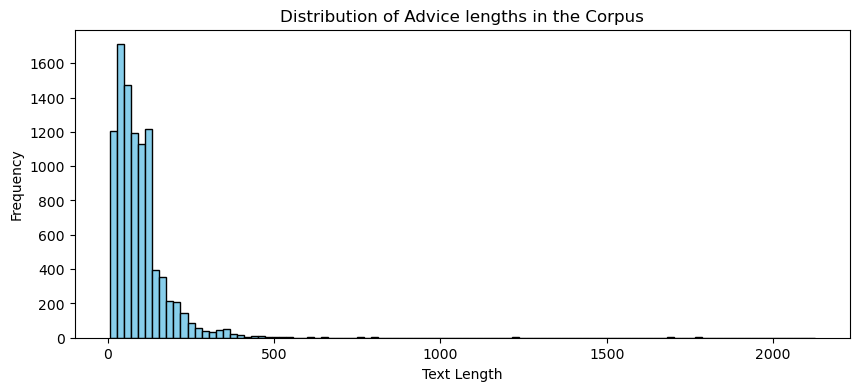

In [51]:
plt.figure(figsize=(10, 4))
plt.hist(data['len_advice'], bins=100, color='skyblue', edgecolor='black')
plt.title('Distribution of Advice lengths in the Corpus')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.show()

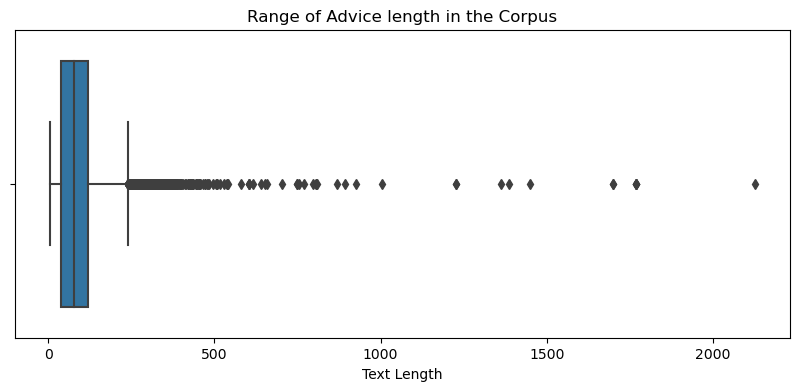

In [52]:
plt.figure(figsize=(10, 4))
sns.boxplot(x=data['len_advice'])
plt.title('Range of Advice length in the Corpus')
plt.xlabel('Text Length')
plt.show()

In [53]:
longest_advice = data[data["len_advice"]==max(data["len_advice"])]["advice_list"]
longest_advice.apply(print)

 avoid drinking milk at bedtime  , avoid spicy foods , avoid hot foods , have daily walk 1 2 kms everyday , especially after having heavy meals  , do not lie on the bed immediately after having meals , sleep on your left side , increase your water intake to at least 2 5 litres  , avoid juices which are sour in taste  citrus juices  , avoid excessive tea and coffee , carbonated drinks , lassi , curd as it will increase your current health issue  , have an early dinner , have a proteins rich diet like missa aata, oats , white chana, black channa  reduce plain wheat flour ,white rice reduce quantity of carbohydrates in dinner   , avoid soyabeans , gandhghobhi , pattagobhi, shalgam , tofu , lobiya, soya floor as they are not advised in hypothyroidism  , for vitamin d deficiency take plenty of dry fruits nuts , oats , mushrooms,exposure to sunlight oil , flaxseed oil capsules , edible cocunut oil , fish oil capsules , eggs , fish , oat meals , yogurt , etc , avoid excessive mental stress , 

896    None
Name: advice_list, dtype: object

### Creating NER Tags - Medical domain spacy model

In [54]:
# Link --> https://github.com/allenai/scispacy
# !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.3/en_core_sci_sm-0.5.3.tar.gz --user

In [55]:
import spacy
nlp = spacy.load("en_core_sci_sm")
doc = nlp("avoid oily and spicy foods, an apple a day keeps a doctor away, oily food is bad so is spicy food.")
[str(x) for x in doc.ents]

C:\Users\susinghrawat\Anaconda3\lib\site-packages\spacy\language.py:2141: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


['oily',
 'spicy foods',
 'apple',
 'day',
 'keeps',
 'doctor away',
 'food',
 'spicy',
 'food']

In [56]:
data["tags"] = data["advice_list"].apply(lambda x: [str(x) for x in nlp(x).ents])

In [57]:
data["tags"] = data["tags"].apply(str)

In [58]:
data.head()

,advice,advice_list,len_advice,tags
0,"['Drink plenty of water', 'eat hot food']","drink plenty of water , eat hot food",38,"['water', 'hot food']"
1,"['avoid oily and spicy foods', 'take steam thr...","avoid oily and spicy foods , take steam thric...",125,"['oily', 'spicy foods', 'steam thrice', 'day',..."
2,"['avoid oily and spicy foods', 'take steam thr...","avoid oily and spicy foods , take steam thric...",125,"['oily', 'spicy foods', 'steam thrice', 'day',..."
3,"['avoid oily and spicy foods', 'take steam thr...","avoid oily and spicy foods , take steam thric...",125,"['oily', 'spicy foods', 'steam thrice', 'day',..."
4,"['eat hot food', 'normal regular diet ', 'all ...","eat hot food , normal regular diet , all food...",237,"['hot food', 'normal regular diet', 'foods', '..."


## Document Retriever

In [59]:
import torch
import pandas as pd
from datasets import load_dataset
from pathlib import Path
from transformers import AutoTokenizer, AutoModel

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)
model.to(device).eval();

def cls_pooling(model_output):
    return model_output.last_hidden_state[:, 0]

def get_embeddings(text_list):
    encoded_input = tokenizer(
        text_list, padding=True, truncation=True, return_tensors="pt"
    )
    encoded_input = {k: v.to(device) for k, v in encoded_input.items()}
    model_output = model(**encoded_input)
    return cls_pooling(model_output)

To create the embeddings using the pretrained model, I tried a few methods like using the cleaned text only or using the tags only. After some iterations, a combination of tags and clean text serves the purpose of creating contextualized embeddings for our retriever model.

In [60]:
from datasets import Dataset
clean_dataset = Dataset.from_dict({
    "original_text":data["advice"].tolist(),
    "cleaned_text":data["advice_list"].tolist(),
    "tags":data["tags"].tolist(),
})

embeddings_dataset = clean_dataset.map(
    lambda x: {"embeddings": get_embeddings(
        "TAGS:"+ x["tags"] + "ADVICE:" + x["cleaned_text"]).detach().cpu().numpy()[0]}
)

Map:   0%|          | 0/9669 [00:00<?, ? examples/s]

In [61]:
embeddings_dataset.add_faiss_index(column="embeddings")

  0%|          | 0/10 [00:00<?, ?it/s]

Dataset({
    features: ['original_text', 'cleaned_text', 'tags', 'embeddings'],
    num_rows: 9669
})

In [79]:
from bertviz import head_view, model_view

question = "Suffering from throat infection what medicines i should take?"
question_embedding = get_embeddings([question]).cpu().detach().numpy()
question_embedding.shape

# Visualizing attention vectors for inputs

def visualize_attention(text):
    inputs = tokenizer(text, return_tensors="pt", is_split_into_words=False)
    outputs = model(**inputs, output_attentions=True)
    head_view(outputs['attentions'], tokens=tokenizer.convert_ids_to_tokens(inputs['input_ids'][0].tolist()))
    model_view(outputs['attentions'], tokens=tokenizer.convert_ids_to_tokens(inputs['input_ids'][0].tolist()))
    
visualize_attention(question)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [68]:
scores, top10 = embeddings_dataset.get_nearest_examples(
    "embeddings", question_embedding, k=10
)

top10_df = pd.DataFrame.from_dict(top10)
top10_df["scores"] = scores
top10_df.sort_values("scores", ascending=False, inplace=True)
top10_df = top10_df[["original_text", "tags", "scores"]].reset_index(drop=True)
top10_df

,original_text,tags,scores
0,['Avoid juices which are sour in taste [ citru...,"['juices', 'sour', 'taste', 'citrus juices', '...",25.573515
1,"['Avoid spicy oily food ', 'Lukewarm water to ...","['spicy', 'food', 'lukewarm water', 'drink', '...",25.393553
2,"['Monitor fever and sp02 ', 'Lukewarm water to...","['fever', 'sp02', 'lukewarm water', 'drink', '...",25.358780
3,"['Avoid spicy oily food ', 'Lukewarm water to ...","['spicy', 'food', 'lukewarm water', 'drink', '...",25.326401
4,"['avoid drinking Milk at bedtime .', 'Avoid ju...","['drinking milk', 'juices', 'sour', 'taste', '...",25.312550
5,['keep on sipping lukewarm water at regular in...,"['lukewarm water', 'regular', 'intervals', 'sp...",24.985395
6,"['avoid drinking Milk at bedtime .', 'Avoid ju...","['drinking milk', 'juices', 'sour', 'taste', '...",24.881187
7,"['Plenty of warm oral fluids', 'Bp monitor ', ...","['warm oral fluids', 'medicine']",24.799845
8,"['Continue same medicine for 5 days', 'Cold sp...","['medicine', 'days', 'cold sponging', 'good pr...",24.612753
9,"['avoid drinking Milk at bedtime .', 'Avoid ju...","['drinking milk', 'juices', 'sour', 'taste', '...",23.328291


### Document visualisation

In [81]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, n_iter=1500, metric="cosine")
X_tsne = tsne.fit_transform(np.array(embeddings_dataset["embeddings"]))

In [89]:
from IPython.display import HTML

tsne_df = pd.DataFrame(X_tsne, columns=["component1", "component2"])
tsne_df["original_text"] = embeddings_dataset["original_text"]

fig = px.scatter(
    tsne_df,
    x="component1",
    y="component2",
    hover_data=[
        "original_text"
    ],
    title="Scatterplot of Embeddings using TSNE",
)
fig.write_html("tsne_visualization.html")
fig.show()
HTML(filename="tsne_visualization.html")

In [71]:
from umap import UMAP

umap_model = UMAP(n_components=2)
embeddings_umap = umap_model.fit_transform(np.array(embeddings_dataset["embeddings"]))

In [90]:
# Step 7: Visualize the embeddings
umap_df = pd.DataFrame(embeddings_umap, columns=["component1", "component2"])
umap_df["original_text"] = embeddings_dataset["original_text"]

fig = px.scatter(
    umap_df,
    x="component1",
    y="component2",
    hover_data=[
        "original_text"
    ],
    title="Scatterplot of Embeddings using UMAP",
)
fig.write_html("umap_visualization.html")
fig.show()
HTML(filename="umap_visualization.html")

### with or without tokenization?

In [74]:
sentence = "this is a sentence with tokenization for example try to break ectomorphs."
tokens = tokenizer(sentence, return_tensors='pt', padding=True, truncation=True)

In [75]:
tokenizer.convert_ids_to_tokens(tokens["input_ids"][0].tolist())

['[CLS]',
 'this',
 'is',
 'a',
 'sentence',
 'with',
 'token',
 '##ization',
 'for',
 'example',
 'try',
 'to',
 'break',
 'ec',
 '##tom',
 '##or',
 '##phs',
 '.',
 '[SEP]']

In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import re

def custom_tokenizer(text):
    tokens = word_tokenize(text)
    return tokens

In [78]:
tfidf_vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer)
tfidf_matrix = tfidf_vectorizer.fit_transform([sentence])
feature_names = tfidf_vectorizer.get_feature_names_out()
tfidf_array = tfidf_matrix.toarray()

print("Feature Names (Words):", feature_names)
print("TF-IDF Matrix:")
print(tfidf_array)

Feature Names (Words): ['.' 'a' 'break' 'ectomorphs' 'example' 'for' 'is' 'sentence' 'this' 'to'
 'tokenization' 'try' 'with']
TF-IDF Matrix:
[[0.2773501 0.2773501 0.2773501 0.2773501 0.2773501 0.2773501 0.2773501
  0.2773501 0.2773501 0.2773501 0.2773501 0.2773501 0.2773501]]


### For the question that was asked in the end - "Tokenization impact on the embeddings - how are words broken into tokens?"
#### I'm not sure how to show that in this assignment but I can maybe provide some insights to the topic. 
* In general, tokenization creates more granular vocabularies by breaking complex words into parts that are familiar to the model. When using these tokenized sentences as inputs to Transformers, this tokenization process helps in providing attention to the important parts of the sentence that might be missed if we don't break these complex words into tokens. 
* Tokenization helps in creating richer embeddings, which provide better context than a non-tokenized sentence embedding.